<a href="https://colab.research.google.com/github/xMatuszek/object_detection_model_using_thermal_camera_dataset/blob/main/object_detection_model_using_thermal_camera_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Dataset

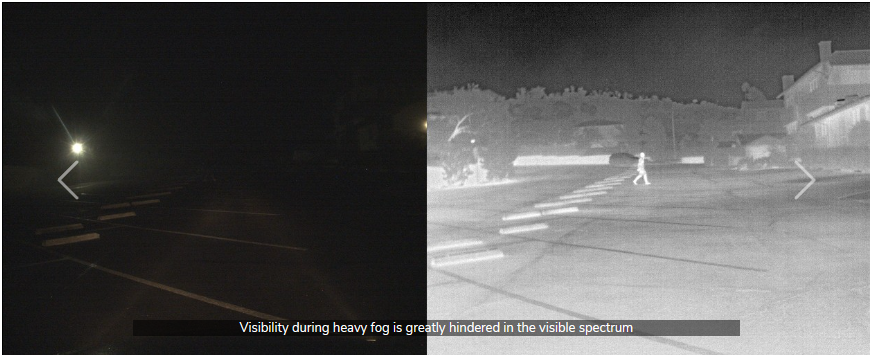


*   Data is organized by **three splits**: training images `("train")`, validation images `("val")`, and validation video `("val_video")`.

*   A total of 9,711 thermal and 9,233 RGB training/validation images are included with a **90%/10% train/val** split



## Labels:
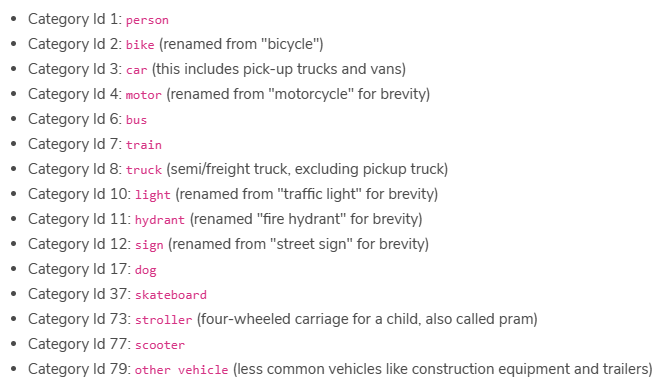







### Thermal Image Annotations
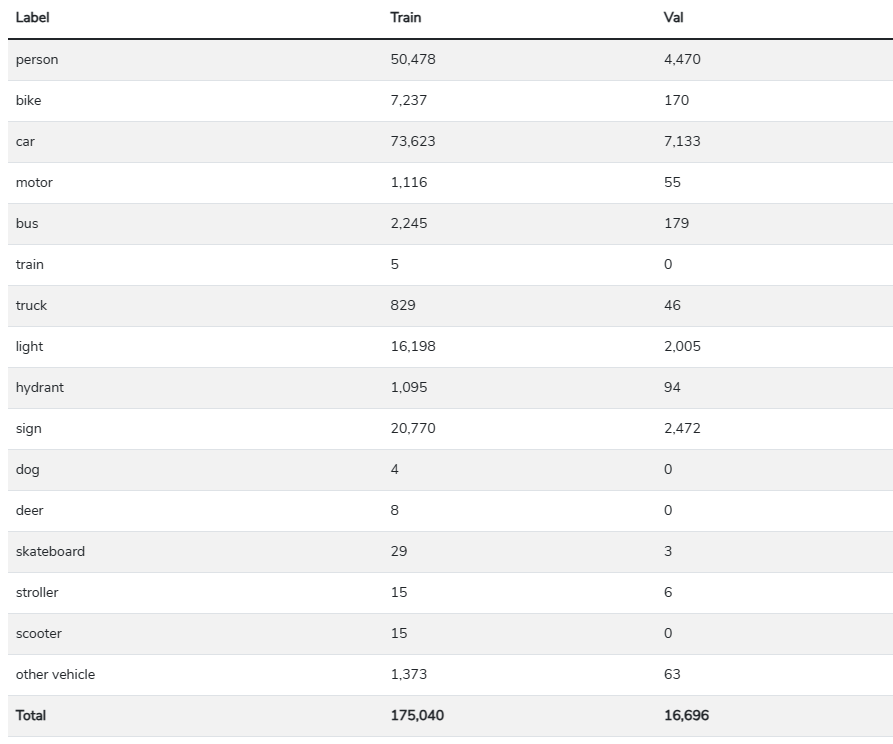

### Visible Image Annotations
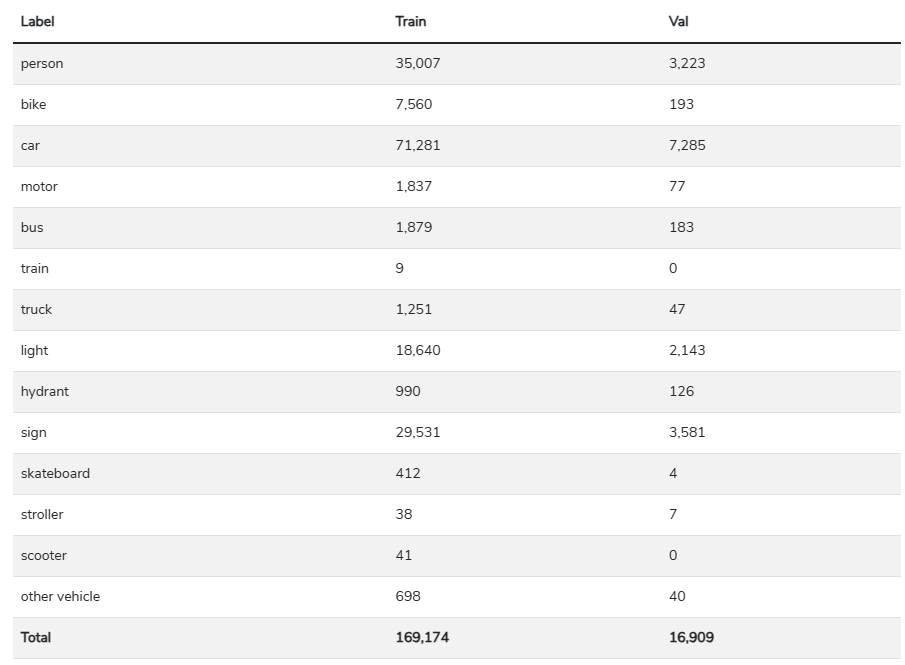

# Ręczna wizualizacja przykładowych danych

Przykładowy obraz z katalogu treningowego **`RGB`**

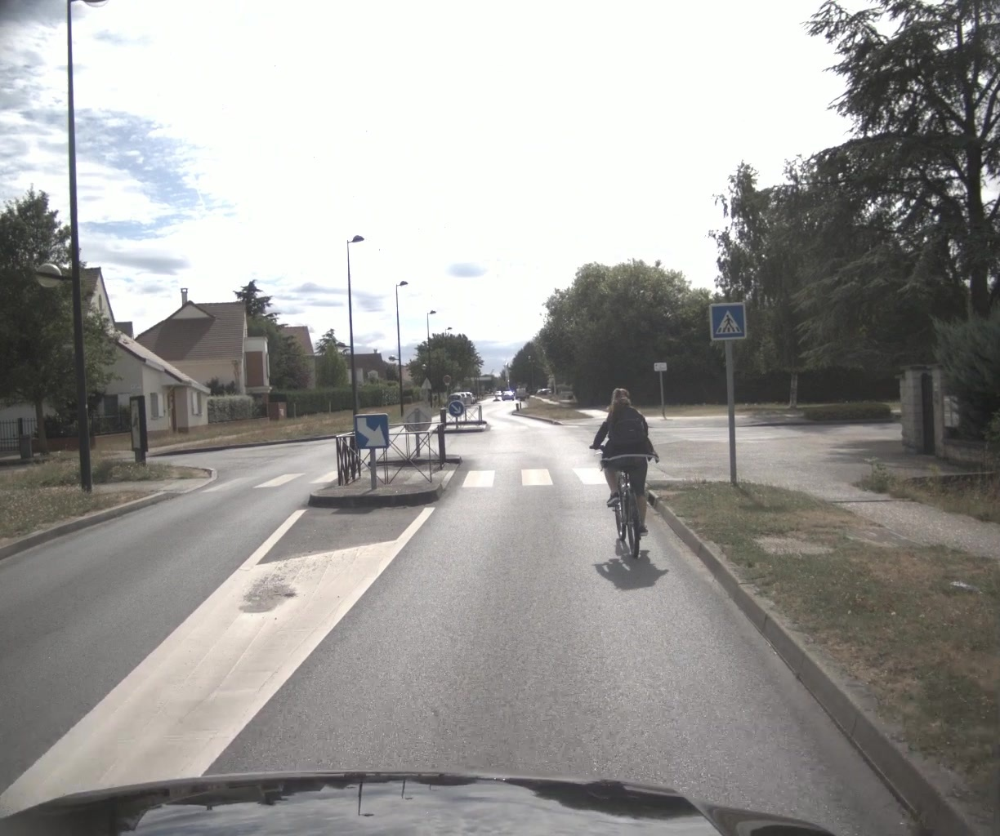

In [ ]:
from IPython.display import Image, display
import os

# Ścieżka do folderu
folder_path = "/content/drive/MyDrive/ob_thermal_camera/dataset/images_rgb_train/data"

# Uzyskaj listę plików w folderze i wybierz pierwszy obraz
first_image_path = os.path.join(folder_path, os.listdir(folder_path)[0])

# Wyświetl pierwszy obraz
display(Image(filename=first_image_path, width=600))


Przykładowy obraz z katalogu treningowego **`THERMAL`**

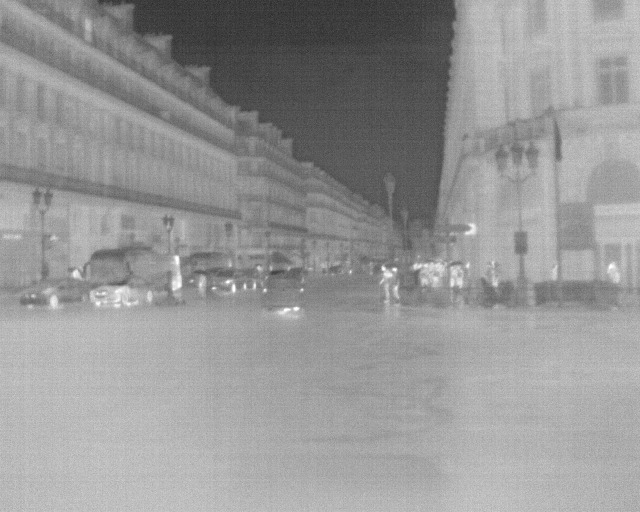

In [ ]:
# Ścieżka do folderu
folder_path = "/content/drive/MyDrive/ob_thermal_camera/dataset/images_thermal_train/data"

# Uzyskaj listę plików w folderze i wybierz pierwszy obraz
first_image_path = os.path.join(folder_path, os.listdir(folder_path)[0])

# Wyświetl pierwszy obraz
display(Image(filename=first_image_path, width=600))


# Wizualizacja przykładowych danych z użyciem `PYCOCOTOOLS`

Importujemy potrzebne biblioteki:

In [ ]:
import os
os.chdir('/content')
HOME = os.getcwd()
print(HOME)

os.chdir(f'/content/drive/MyDrive/ob_thermal_camera/data set')
dataset_location = os.getcwd()
print(dataset_location)

/content


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/ob_thermal_camera/data set'

In [ ]:
!pip install pycocotools
import pandas as pd
import os
from pycocotools.coco import COCO
import skimage.io as io
import matplotlib.pyplot as plt
from pathlib import Path

In [ ]:
dataDir=Path(f'{dataset_location}/images_rgb_train')
annFile = Path(f'{dataset_location}/images_rgb_train/coco.json')
coco = COCO(annFile)
imgIds = coco.getImgIds()
imgs = coco.loadImgs(imgIds[-3:])

loading annotations into memory...
Done (t=1.73s)
creating index...
index created!


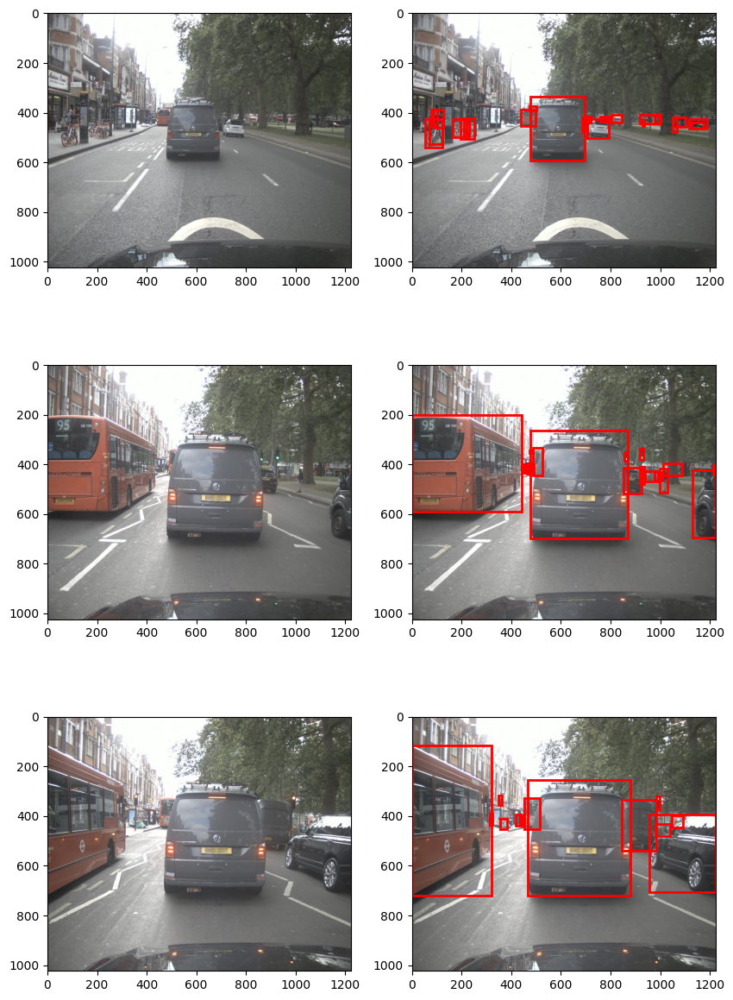

In [ ]:
import matplotlib.patches as patches

imgs = coco.loadImgs(imgIds[-3:])
_,axs = plt.subplots(len(imgs),2,figsize=(10,5 * len(imgs)))
for img, ax in zip(imgs, axs):
  I = io.imread(dataDir / img['file_name'])
  annIds = coco.getAnnIds(imgIds=[img['id']])
  anns = coco.loadAnns(annIds)
  ax[0].imshow(I)
  ax[1].imshow(I)

  # Loop through annotations and draw rectangles
  for ann in anns:
    bbox = ann['bbox']  # Get bounding box coordinates
    x_min, y_min, width, height = bbox
    rectangle = patches.Rectangle(xy=(x_min, y_min),
                                 width=width, height=height,
                                 linewidth=2, edgecolor='r', facecolor='none')  # Red border, no fill
    ax[1].add_patch(rectangle)

plt.show()


# Modyfikujemy klasy oraz usuwamy zdjęcia, które nie zawierają żadnych z poniższych klas

Uznaliśmy, że zostawimy **5 klas**:

*   bus
*   car
*   other vehicle
*   person
*   sign

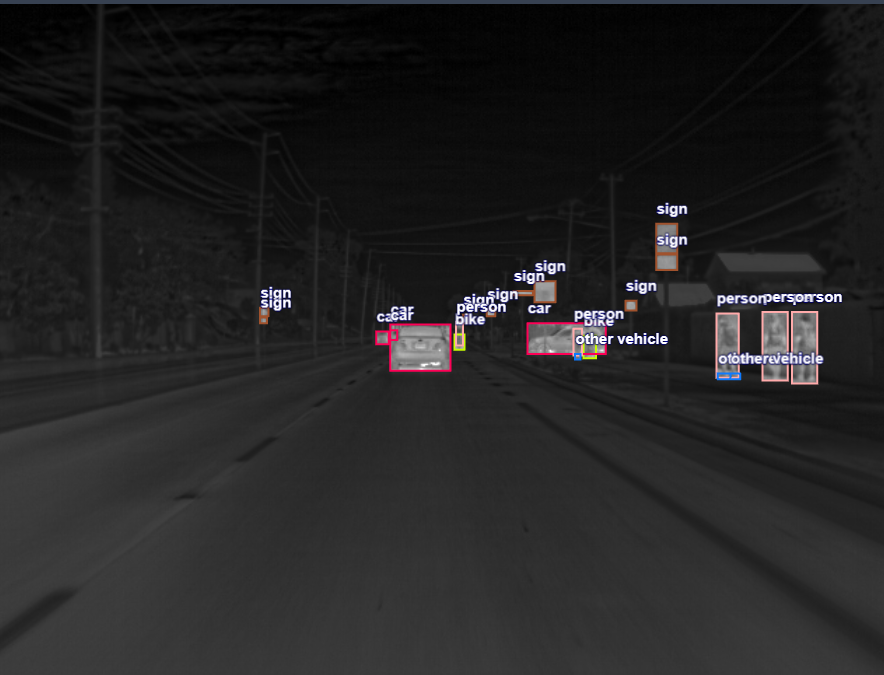



# Konwersja COCO na YOLO

### ***COCO*** format:

dataset_subfolder:

**→ data** (zawiera wszystkie obrazy)

*   image1.jpg
*   ...


**→ coco.json** (zawiera adnotacje dla wszystkich obrazów)

**→ coco_annotation_counts.tsv** (zliczenie ilości danych klas w formaxie tsv)

**→ coco_annotation_counts.txt** (zliczenie ilości danych klas w formaxie tsv)

**→ index.json**


### ***YOLO*** format:
dataset_subfolder:

**→ data** (zawiera wszystkie obrazy)

**→ labels** (zawiera wszystkie etykiety)

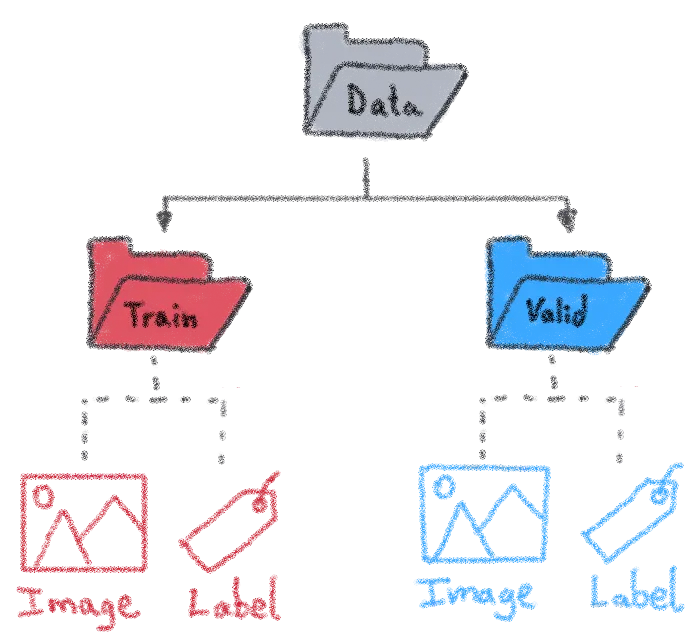

# Tworzymy model YOLOv9 na własnym datasecie - **THERMAL**

**UWAGA:** do stworzenia modelu użyliśmy jedynie danych ze zbioru treningowego (ok. 10k zdjęc) i jego dzieliliśmy na odpowiednie części (85% train; 10% valid; 5% test)

### Pobieramy yolov9

In [2]:
!git clone https://github.com/WongKinYiu/yolov9
%cd yolov9
!pip3 install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 713, done.
remote: Counting objects: 100% (339/339), done.
remote: Compressing objects: 100% (118/118), done.
remote: Total 713 (delta 247), reused 234 (delta 214), pack-reused 374
Receiving objects: 100% (713/713), 3.24 MiB | 9.31 MiB/s, done.
Resolving deltas: 100% (292/292), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 64.2 MB/s eta 0:00:00


### Importujemy baze z roboflow

In [2]:
%cd /content/yolov9
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xxx")
project = rf.workspace("thermalobjectdetectionmodel").project("thermal_object_detection_modell")
version = project.version(3)
dataset = version.download("yolov9")



/content/yolov9
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to thermal_object_detection_modell-3 in yolov9:: 100%|██████████| 19500/19500 [00:02<00:00, 6599.08it/s]


### Przypisanie zmiennych
Przypisujemy katalogi `HOME` oraz `dataset_location`, które wskazują odpowiednio na katalog główny oraz katalog z datasetem w celu ułatwienia dalszych operacji

In [ ]:
import os
os.chdir('/content')
HOME = os.getcwd()
print(HOME)

os.chdir(f'/content/yolov9/thermal_object_detection_modell-3')
dataset_location = os.getcwd()
print(dataset_location)

/content
/content/yolov9/thermal_object_detection_modell-3


### Pobieramy wagi dla modelu

In [3]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.p

### Trenujemy nasz model

In [ ]:
%cd /content/yolov9
!python train_dual.py \
--batch 16 --epochs 10 --img 640  --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset_location}/data.yaml \
--weights {HOME}/weights/yolov9-c.pt \
--cfg models/detect/yolov9-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-05-27 16:24:26.754682: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-27 16:24:26.810762: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-27 16:24:26.810817: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-27 16:24:26.812467: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-27 16:24:26.820975: I tensorflow/core/platform/

### Wyświetlamy wykresy na zbiorze uczącycm

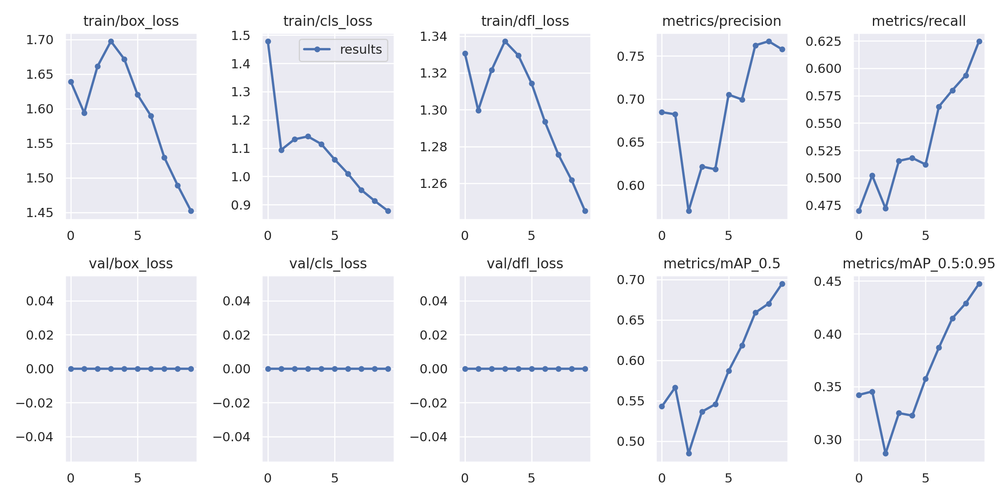

In [ ]:
from IPython.display import Image
Image(filename=f"{HOME}/yolov9/runs/train/exp2/results.png", width=1000)

### Wyświetlamy przykładowe wyniki na zbiorze uczącycm

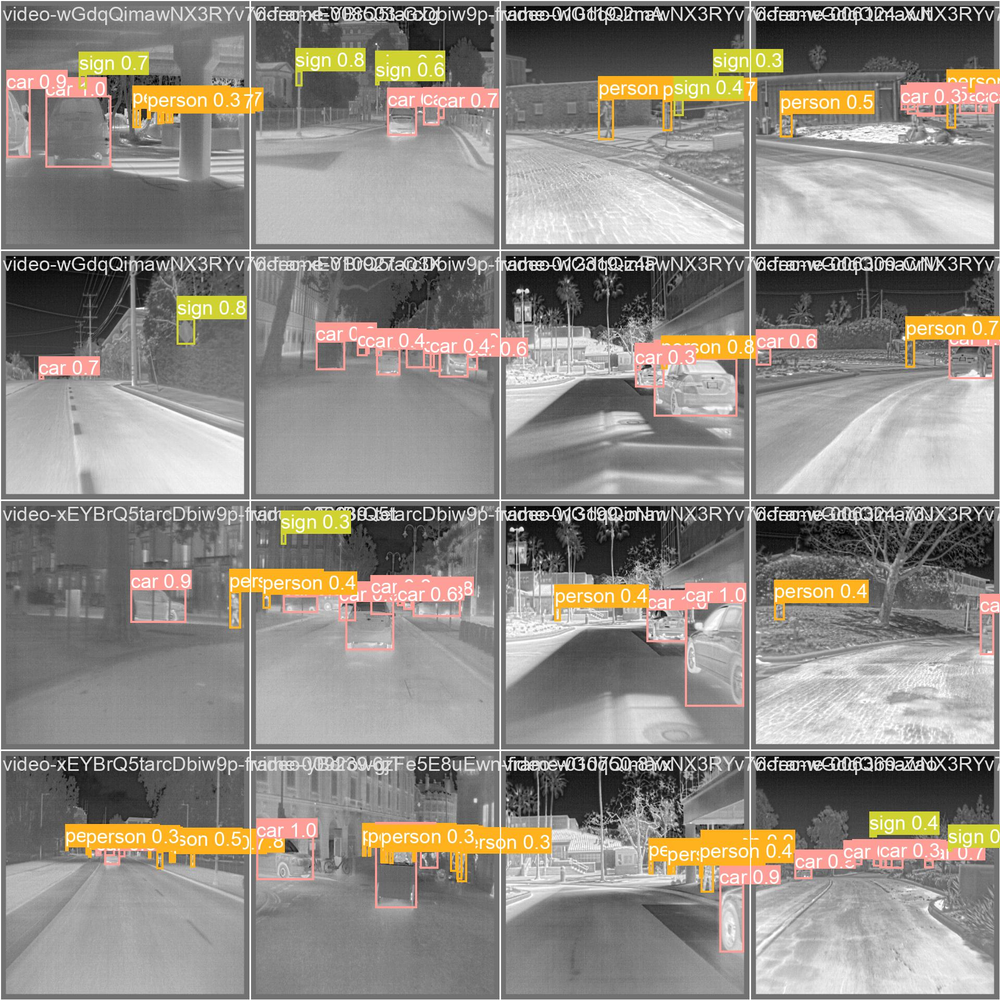

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/val_batch0_pred.jpg", width=1000)

### Macierz błędów dla zbioru uczącego

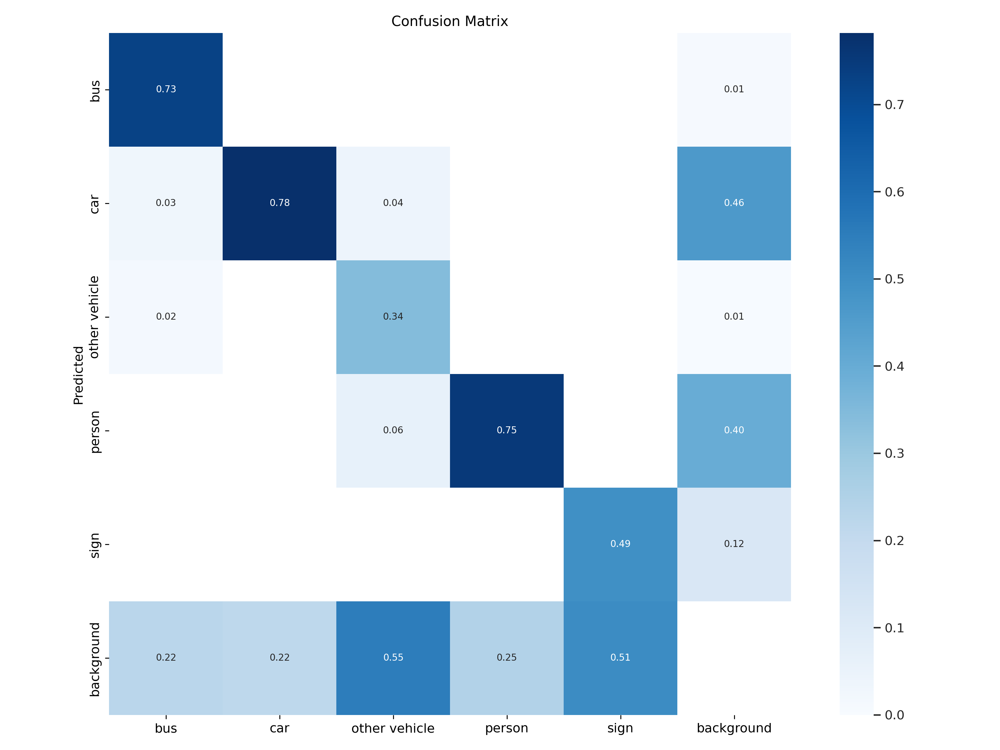

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/confusion_matrix.png", width=1000)

## Testowanie modelu na zbiorze walidacyjnym i pomiar metryk:

In [ ]:
%cd /content/yolov9
!python val_dual.py \
--img 640 --device 0 \
--weights /content/drive/MyDrive/ob_thermal_camera/dataset/best_thermal.pt \
--data /content/yolov9/thermal_object_detection_modell-3/data.yaml

/content/yolov9
val_dual: data=/content/yolov9/thermal_object_detection_modell-3/data.yaml, weights=['/content/drive/MyDrive/ob_thermal_camera/dataset/best_thermal.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 v0.1-89-g93f1a28 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
yolov9-c summary: 604 layers, 50707518 parameters, 0 gradients, 236.7 GFLOPs
val: Scanning /content/yolov9/thermal_object_detection_modell-3/valid/labels... 982 images, 0 backgrounds, 0 corrupt: 100% 982/982 [00:00<00:00, 8729.41it/s]
val: New cache created: /content/yolov9/thermal_object_detection_modell-3/valid/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 31/

###Wykresych krzywych:

F1 (harmonic mean of precision and recall) - większy peak sugeruję wiekszą wydajność modelu

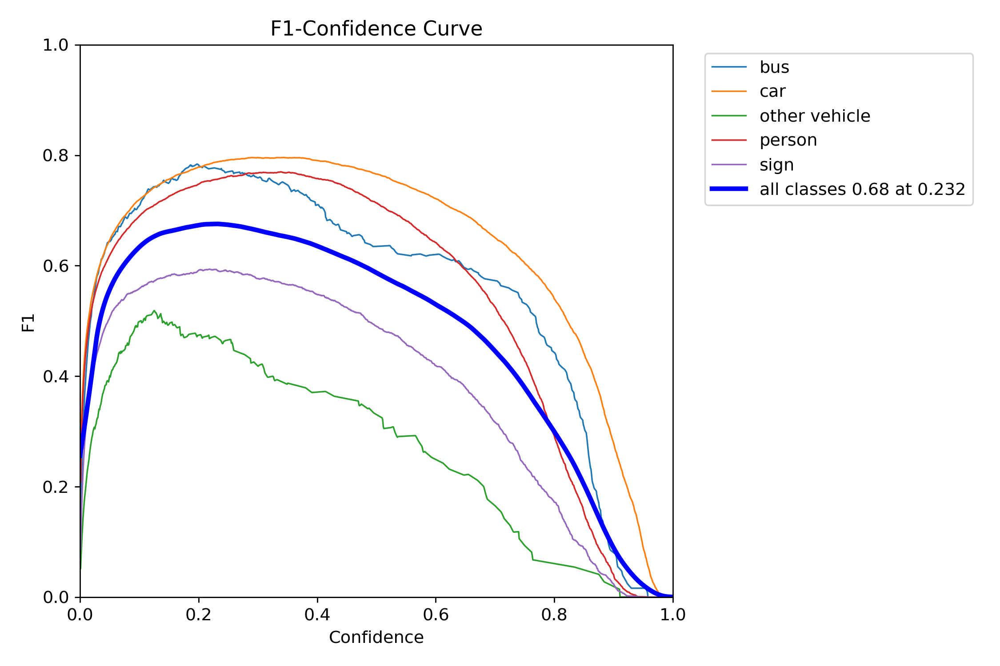

In [ ]:
from IPython.display import Image
Image(filename=f"/content/yolov9/runs/val/exp2/F1_curve.png", width=600)

Precision-Recall Curve (the trade-off between precision and recall) - im więcej w prawym górnym rogu tym lepiej

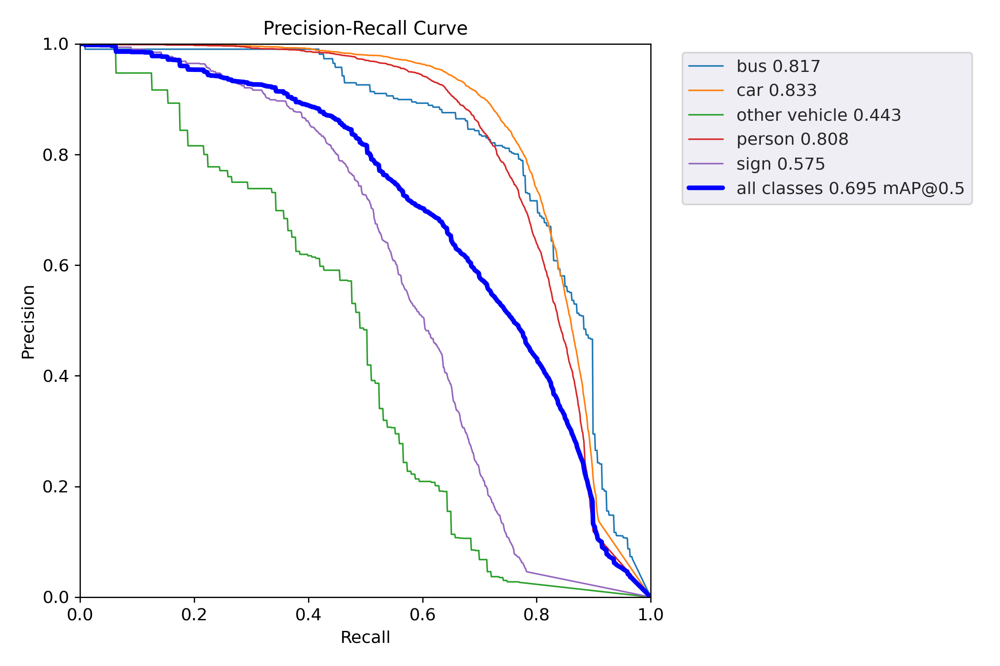

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp2/PR_curve.png", width=600)

Precision-Confidence Curve (displays how precision changes with different confidence levels) - idealnie gdyby była wysoka precyzja dla wszystkich poziomów pewności

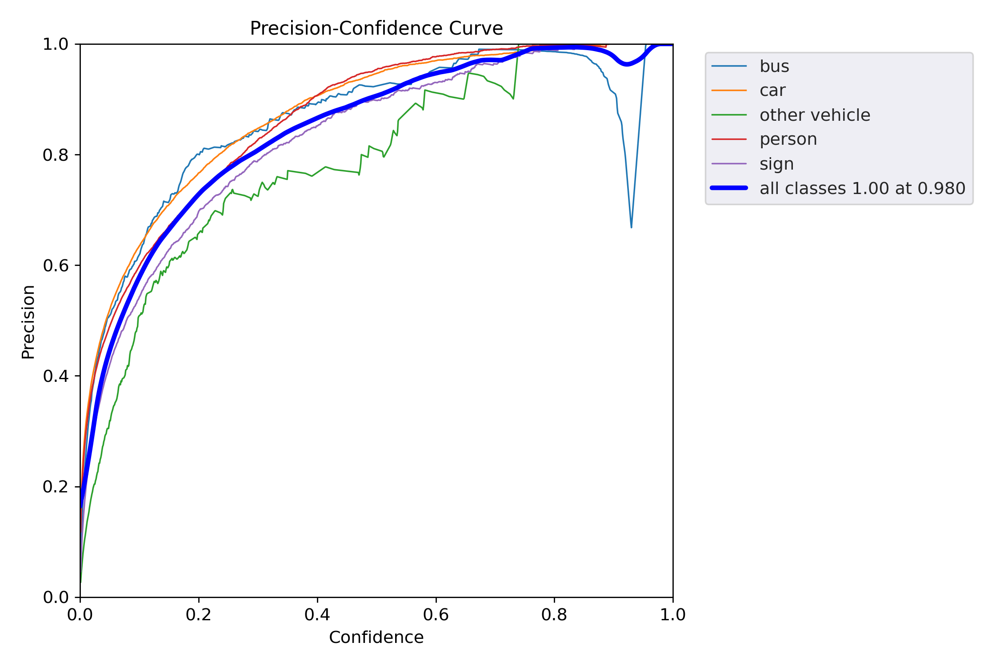

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp2/P_curve.png", width=600)

Recall-Confidence Curve (shows the recall at various confidence thresholds) - oczekujemy wysokich poziomow dla wszystkich poziomów pewności

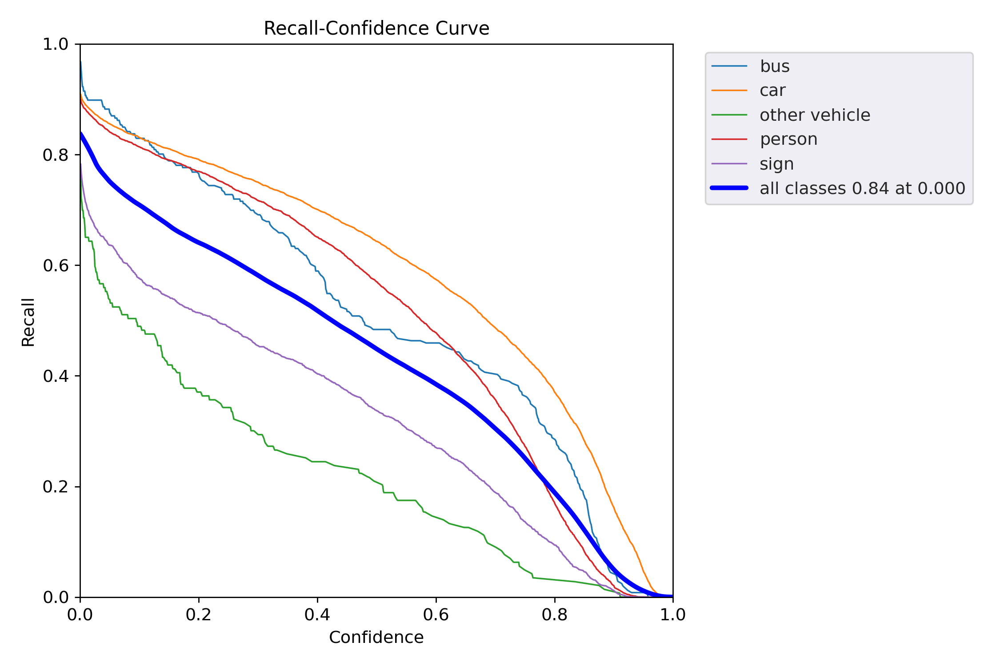

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp2/R_curve.png", width=600)

Macierz błędów:


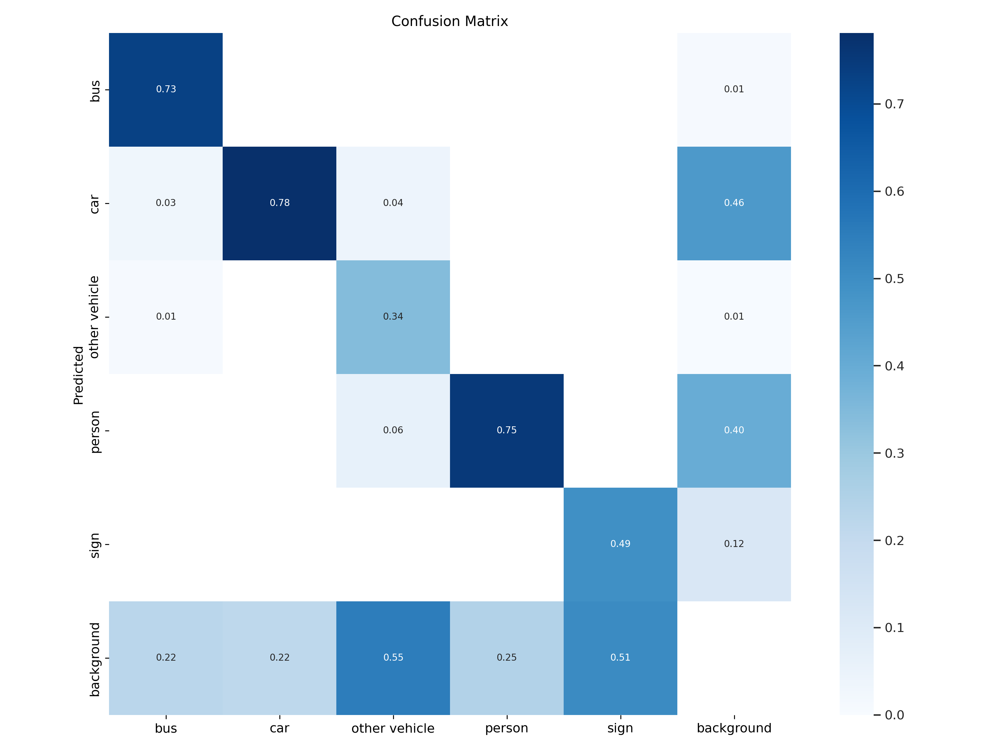

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp2/confusion_matrix.png", width=1000)

## Testowanie modelu na zbiorze testowym i pomiar metryk:

In [11]:
%cd /content/yolov9
!python val_dual.py \
--img 640 --device 0 \
--weights /content/drive/MyDrive/ob_thermal_camera/dataset/best_thermal.pt \
--data /content/yolov9/thermal_object_detection_modell-3/data.yaml \
--task test

/content/yolov9
val_dual: data=/content/yolov9/thermal_object_detection_modell-3/data.yaml, weights=['/content/drive/MyDrive/ob_thermal_camera/dataset/best_thermal.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=test, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 v0.1-95-g493e523 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
yolov9-c summary: 604 layers, 50707518 parameters, 0 gradients, 236.7 GFLOPs
test: Scanning /content/yolov9/thermal_object_detection_modell-3/test/labels... 485 images, 0 backgrounds, 0 corrupt: 100% 485/485 [00:00<00:00, 7646.65it/s]
test: New cache created: /content/yolov9/thermal_object_detection_modell-3/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 16

###Wykresych krzywych:

F1 (harmonic mean of precision and recall) - większy peak sugeruję wiekszą wydajność modelu

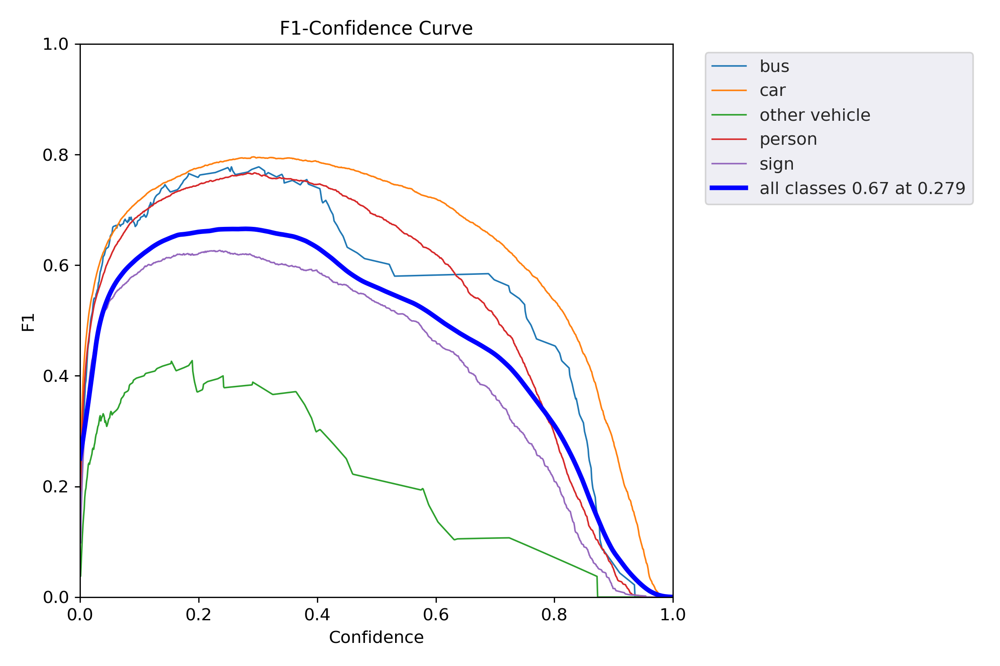

In [12]:
from IPython.display import Image
Image(filename=f"/content/yolov9/runs/val/exp4/F1_curve.png", width=600)

Precision-Recall Curve (the trade-off between precision and recall) - im więcej w prawym górnym rogu tym lepiej

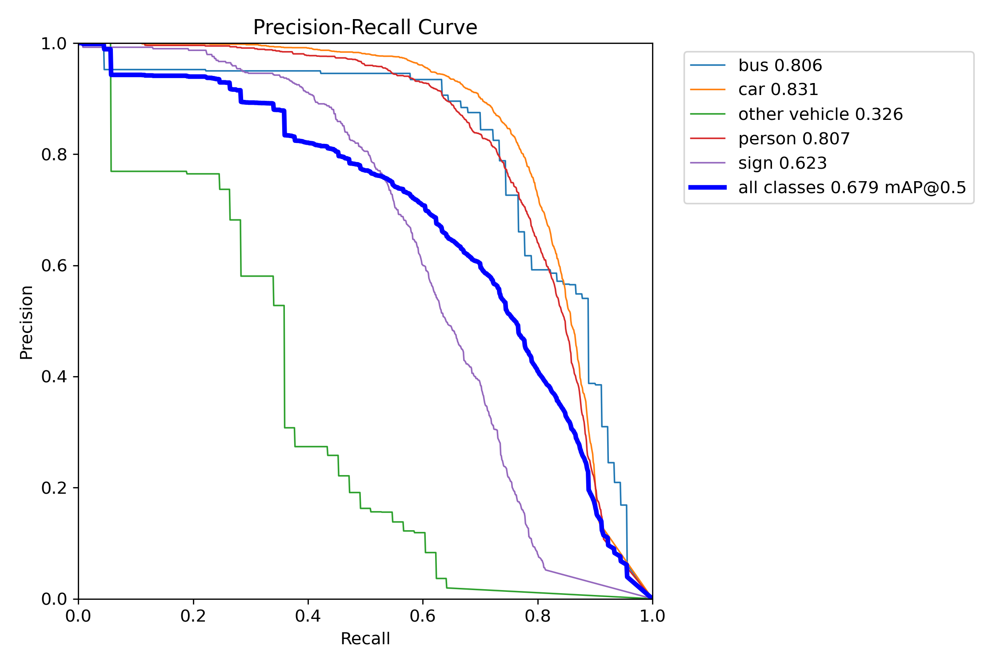

In [13]:
Image(filename=f"/content/yolov9/runs/val/exp4/PR_curve.png", width=600)

Precision-Confidence Curve (displays how precision changes with different confidence levels) - idealnie gdyby była wysoka precyzja dla wszystkich poziomów pewności

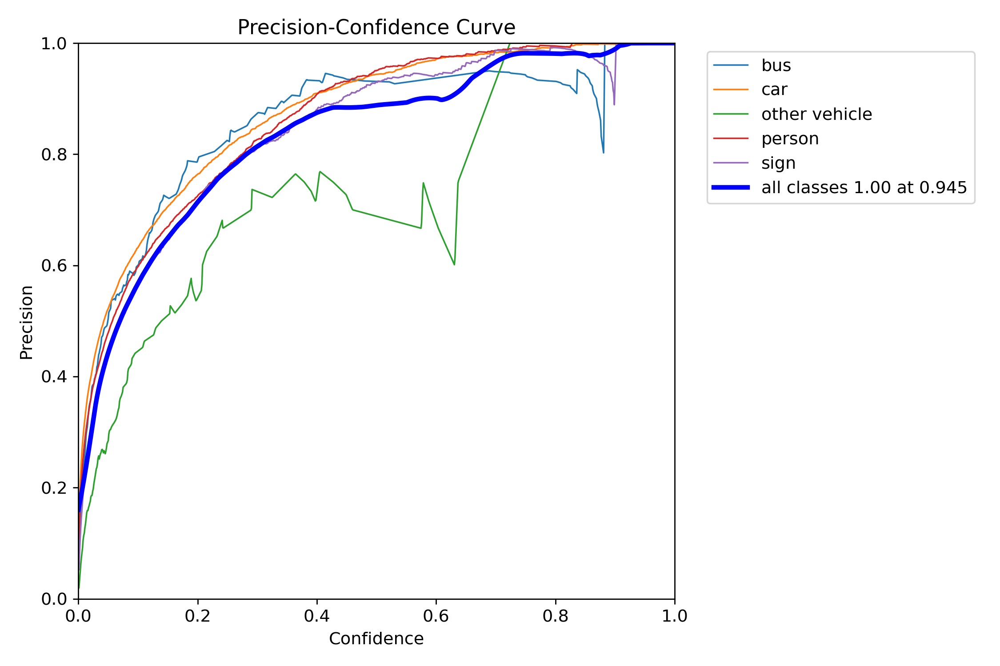

In [14]:
Image(filename=f"/content/yolov9/runs/val/exp4/P_curve.png", width=600)

Recall-Confidence Curve (shows the recall at various confidence thresholds) - oczekujemy wysokich poziomow dla wszystkich poziomów pewności

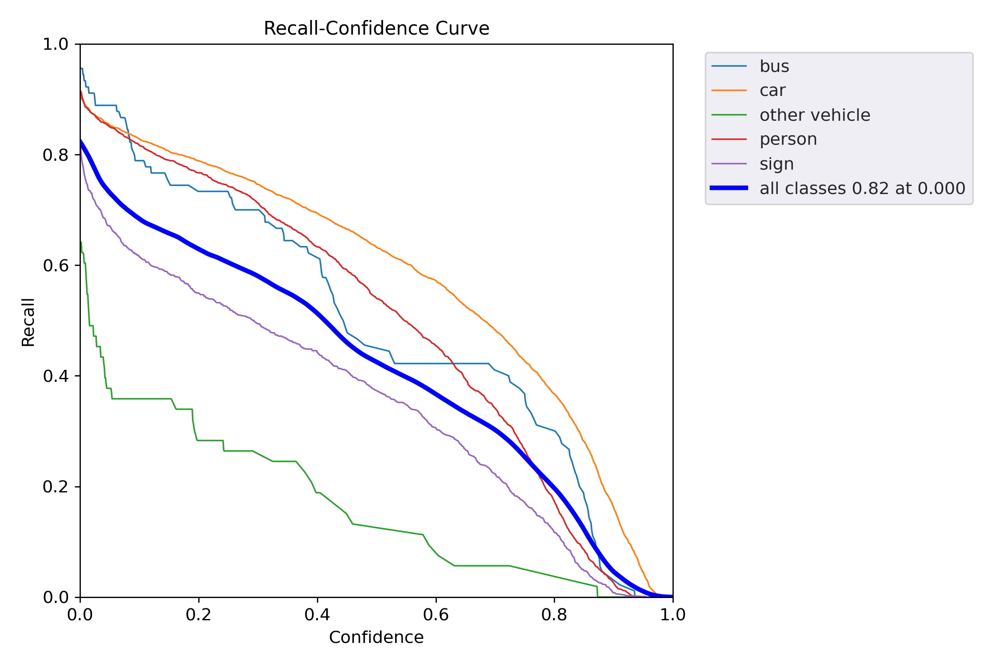

In [15]:
Image(filename=f"/content/yolov9/runs/val/exp4/R_curve.png", width=600)

Macierz błędów:


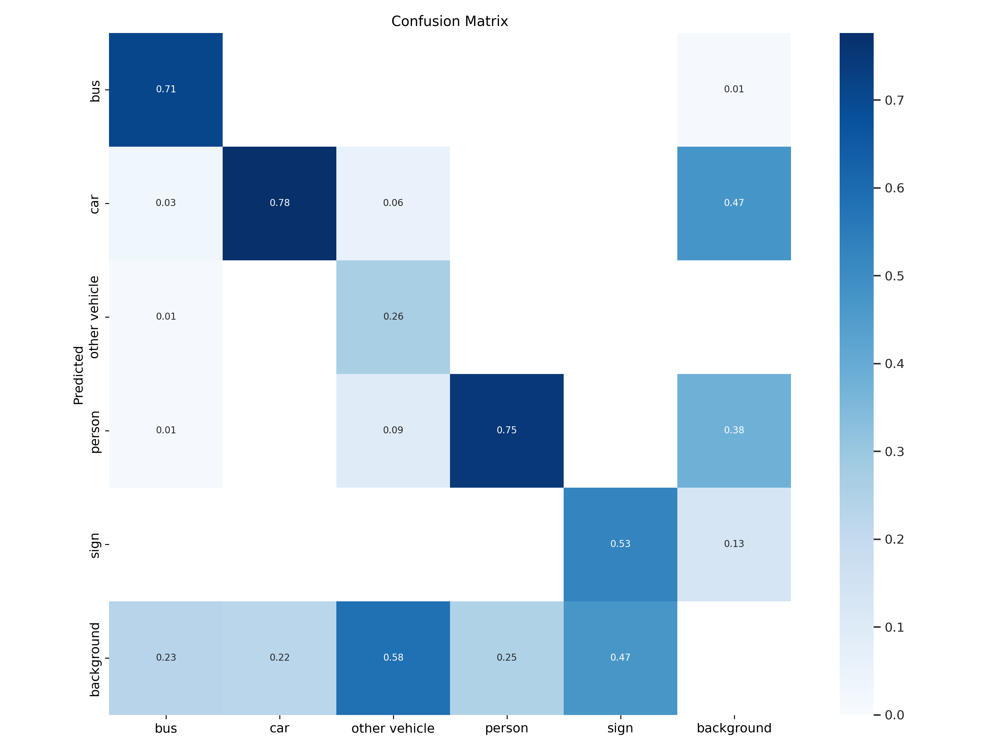

In [16]:
Image(filename=f"/content/yolov9/runs/val/exp4/confusion_matrix.png", width=1000)

# Tworzymy model YOLOv9 na własnym datasecie - **RGB**

**UWAGA:** do stworzenia modelu użyliśmy jedynie danych ze zbioru treningowego (ok. 10k zdjęc) i jego dzieliliśmy na odpowiednie części (85% train; 10% valid; 5% test)

### Importujemy baze z roboflow

In [17]:
%cd /content/yolov9
!pip install roboflow

/content/yolov9


In [19]:
from roboflow import Roboflow
rf = Roboflow(api_key="xxx")
project = rf.workspace("rgbobjectdetectionmodel").project("rgb_object_detection_model-nt5d6")
version = project.version(1)
dataset = version.download("yolov9")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to rgb_object_detection_model-1 in yolov9:: 100%|██████████| 16216/16216 [00:02<00:00, 7211.61it/s]


### Przypisanie zmiennych
Przypisujemy katalogi `HOME` oraz `dataset_location`, które wskazują odpowiednio na katalog główny oraz katalog z datasetem w celu ułatwienia dalszych operacji

In [20]:
import os
os.chdir('/content')
HOME = os.getcwd()
print(HOME)

os.chdir(f'/content/yolov9/rgb_object_detection_model-1')
dataset_location = os.getcwd()
print(dataset_location)

/content
/content/yolov9/rgb_object_detection_model-1


## Trenujemy nasz model

In [ ]:
%cd /content/yolov9
!python train_dual.py \
--batch 16 --epochs 10 --img 640  --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset_location}/data.yaml \
--weights {HOME}/weights/yolov9-c.pt \
--cfg models/detect/yolov9-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-05-28 15:53:02.186365: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-28 15:53:02.240220: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-28 15:53:02.240263: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-28 15:53:02.242199: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-28 15:53:02.250709: I tensorflow/core/platform/

### Wyświetlamy wykresy na zbiorze uczącycm

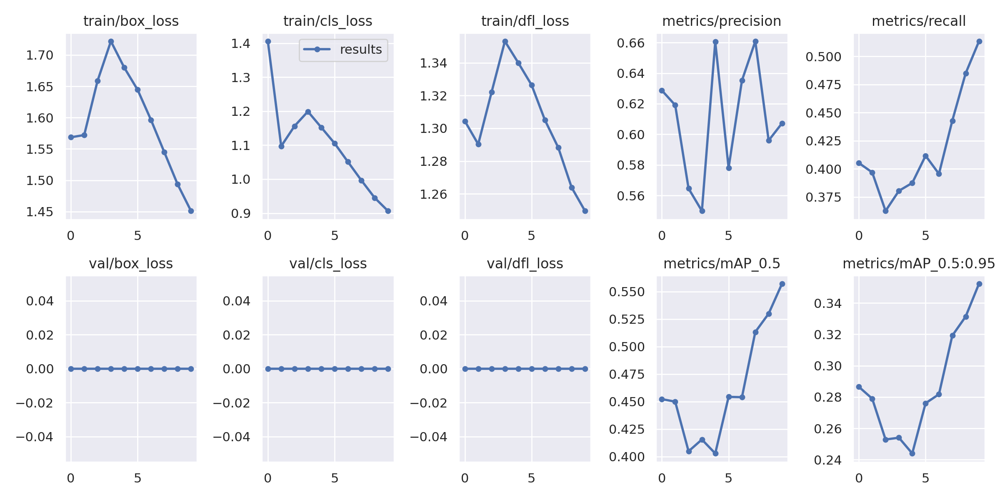

In [ ]:
from IPython.display import Image
Image(filename=f"{HOME}/yolov9/runs/train/exp2/results.png", width=1000)

### Wyświetlamy wyniki na zbiorze uczącycm

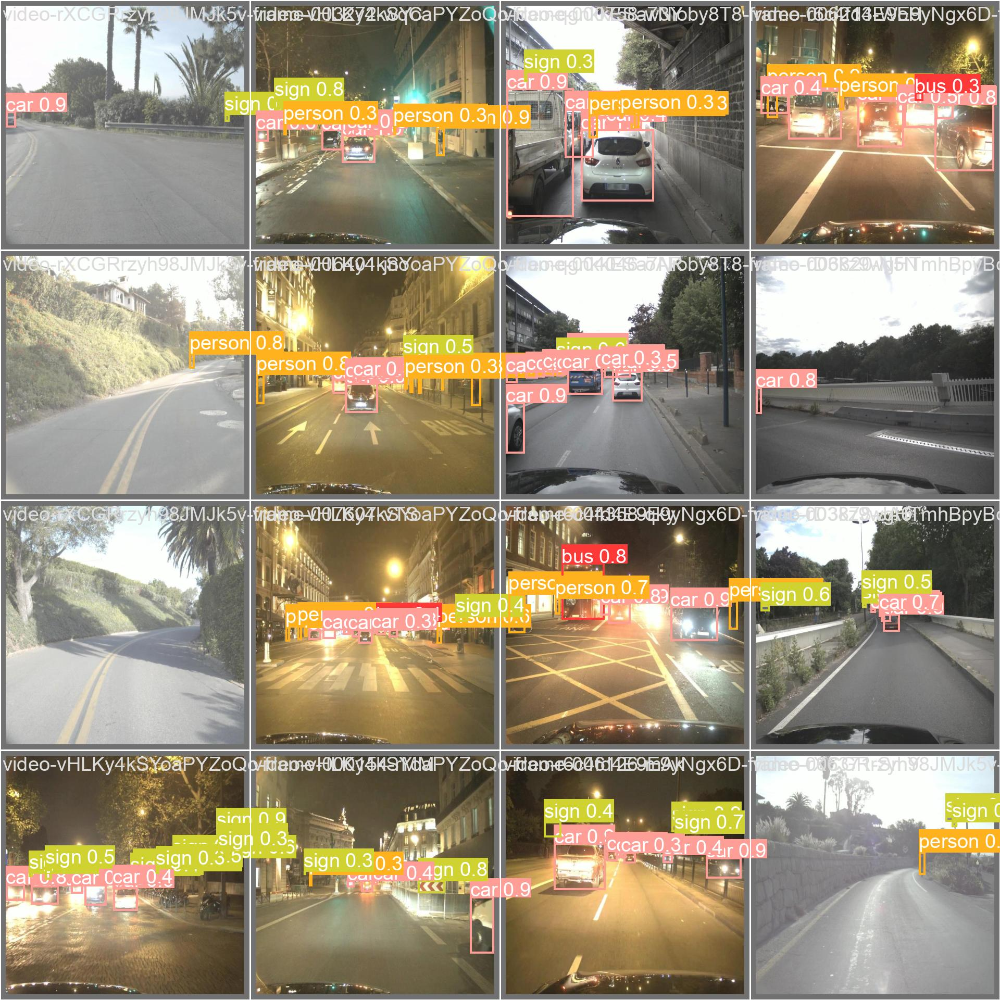

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/val_batch0_pred.jpg", width=1000)

### Macierz błędów dla zbioru uczącego

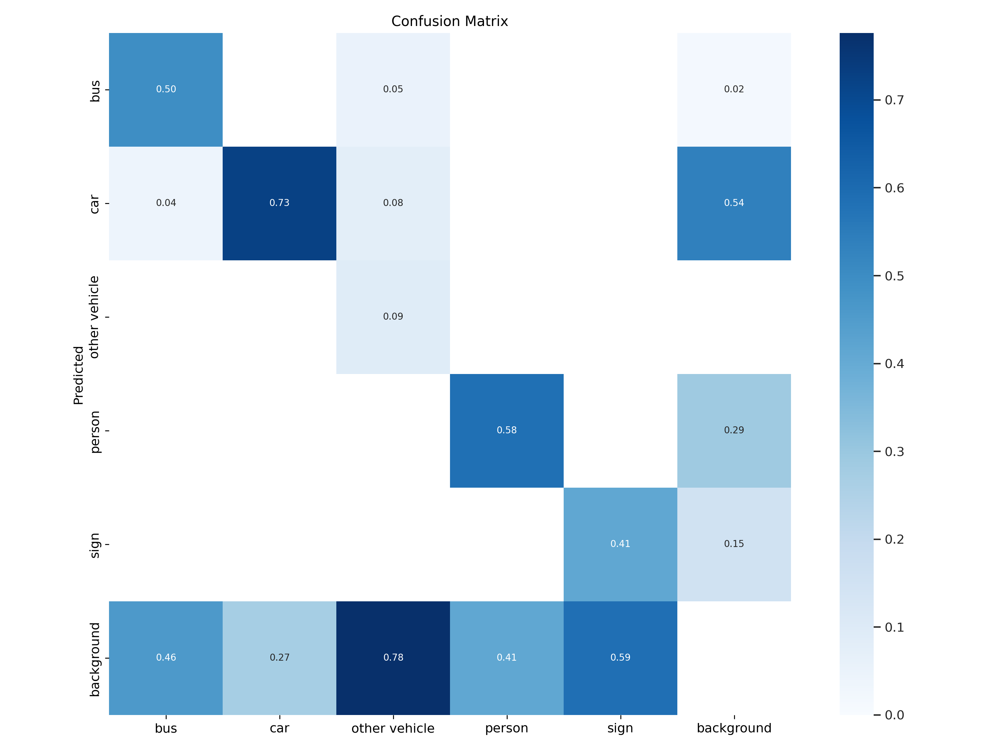

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp2/confusion_matrix.png", width=1000)

## Testowanie modelu na zbiorze walidacyjnym i pomiar metryk:

In [ ]:
%cd /content/yolov9
!python val_dual.py \
--img 640 --device 0 \
--weights /content/drive/MyDrive/ob_thermal_camera/dataset/best_rgb.pt \
--data /content/yolov9/rgb_object_detection_model-1/data.yaml

/content/yolov9
val_dual: data=/content/yolov9/rgb_object_detection_model-1/data.yaml, weights=['/content/drive/MyDrive/ob_thermal_camera/dataset/best_rgb.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 v0.1-89-g93f1a28 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
yolov9-c summary: 604 layers, 50707518 parameters, 0 gradients, 236.7 GFLOPs
100% 755k/755k [00:00<00:00, 120MB/s]
val: Scanning /content/yolov9/rgb_object_detection_model-1/valid/labels... 822 images, 0 backgrounds, 0 corrupt: 100% 822/822 [00:00<00:00, 7015.53it/s]
val: New cache created: /content/yolov9/rgb_object_detection_model-1/valid/labels.cache
                 Class     Images  Instances          P          R      mAP50  

###Wykresych krzywych:

F1 (harmonic mean of precision and recall) - większy peak sugeruję wiekszą wydajność modelu

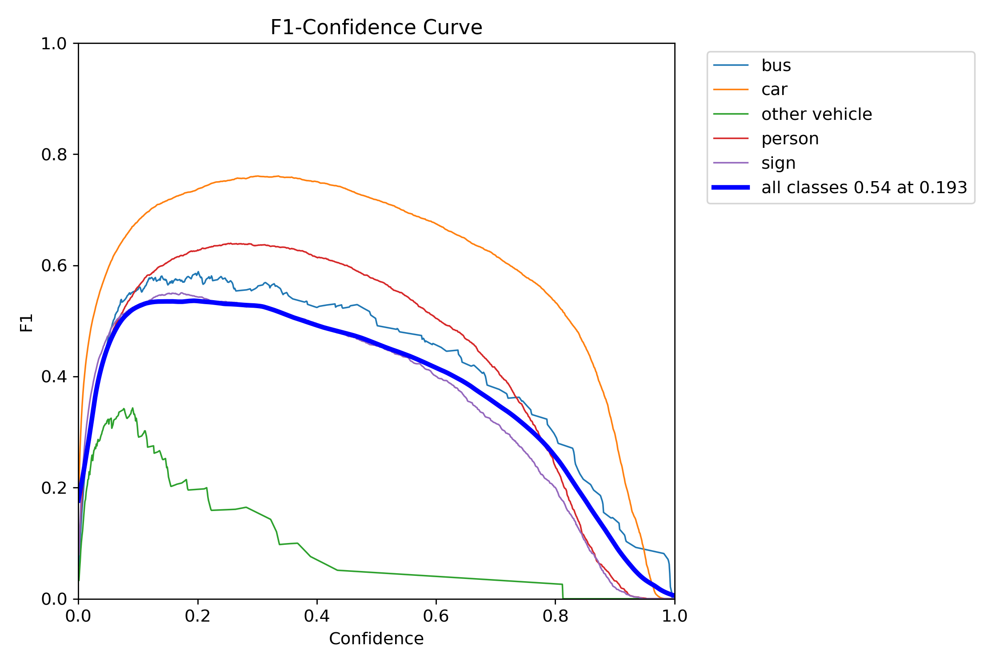

In [ ]:
from IPython.display import Image
Image(filename=f"/content/yolov9/runs/val/exp/F1_curve.png", width=600)

Precision-Recall Curve (the trade-off between precision and recall) - im więcej w prawym górnym rogu tym lepiej

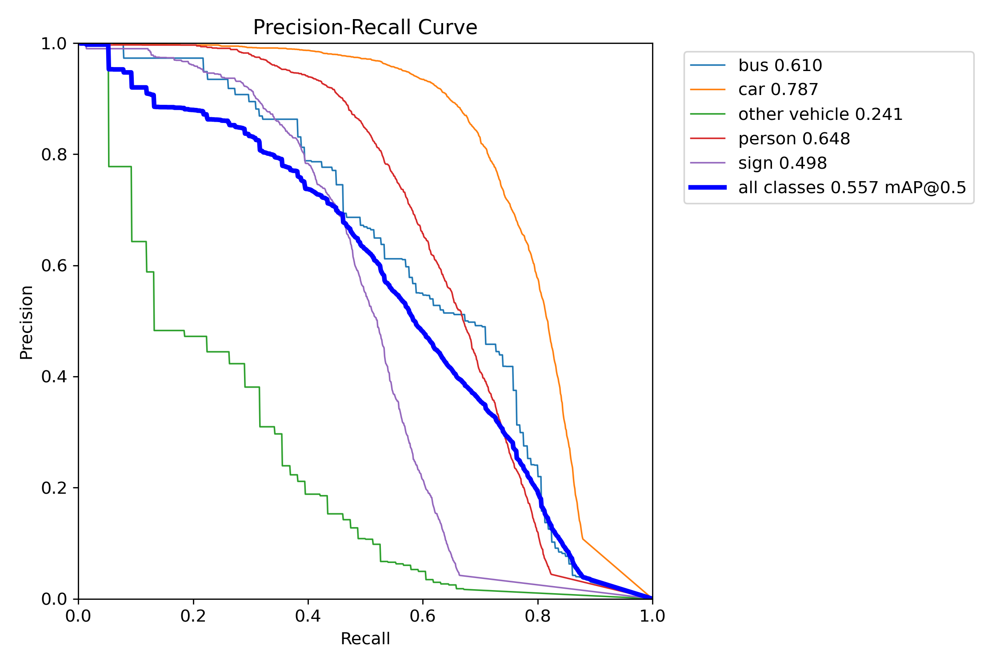

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp/PR_curve.png", width=600)

Precision-Confidence Curve (displays how precision changes with different confidence levels) - idealnie gdyby była wysoka precyzja dla wszystkich poziomów pewności

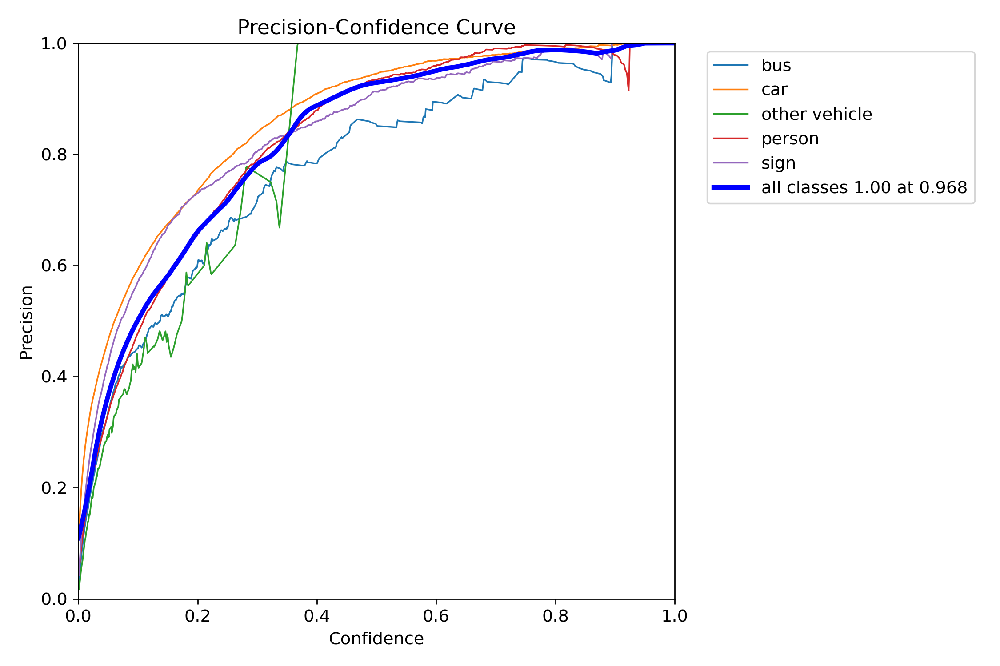

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp/P_curve.png", width=600)

Recall-Confidence Curve (shows the recall at various confidence thresholds) - oczekujemy wysokich poziomow dla wszystkich poziomów pewności

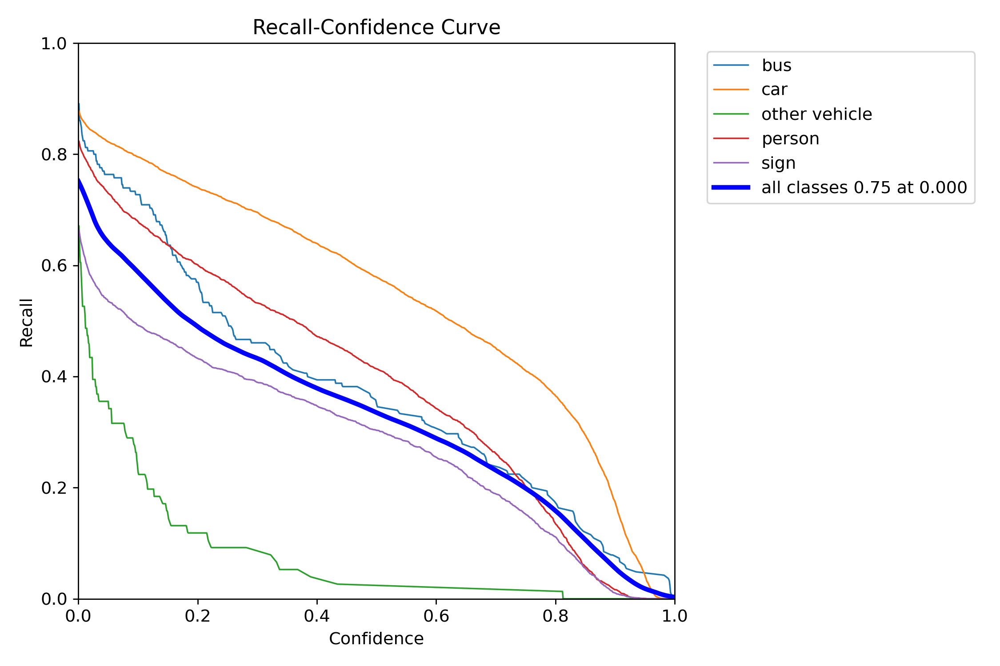

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp/R_curve.png", width=600)

Macierz błędów:


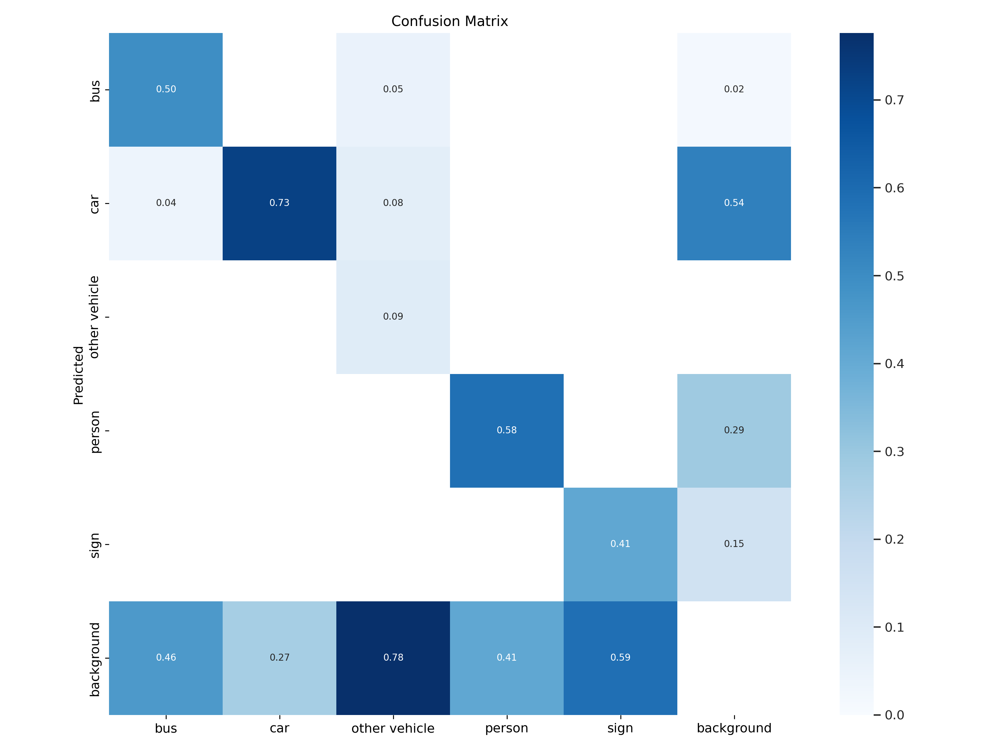

In [ ]:
Image(filename=f"/content/yolov9/runs/val/exp/confusion_matrix.png", width=1000)

## Testowanie modelu na zbiorze testowym i pomiar metryk:

In [21]:
%cd /content/yolov9
!python val_dual.py \
--img 640 --device 0 \
--weights /content/drive/MyDrive/ob_thermal_camera/dataset/best_rgb.pt \
--data /content/yolov9/rgb_object_detection_model-1/data.yaml \
--task test

/content/yolov9
val_dual: data=/content/yolov9/rgb_object_detection_model-1/data.yaml, weights=['/content/drive/MyDrive/ob_thermal_camera/dataset/best_rgb.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=test, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 v0.1-95-g493e523 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
yolov9-c summary: 604 layers, 50707518 parameters, 0 gradients, 236.7 GFLOPs
test: Scanning /content/yolov9/rgb_object_detection_model-1/test/labels... 416 images, 0 backgrounds, 0 corrupt: 100% 416/416 [00:00<00:00, 7717.38it/s]
test: New cache created: /content/yolov9/rgb_object_detection_model-1/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 13/13 [00:23<00:00,  

###Wykresych krzywych:

F1 (harmonic mean of precision and recall) - większy peak sugeruję wiekszą wydajność modelu

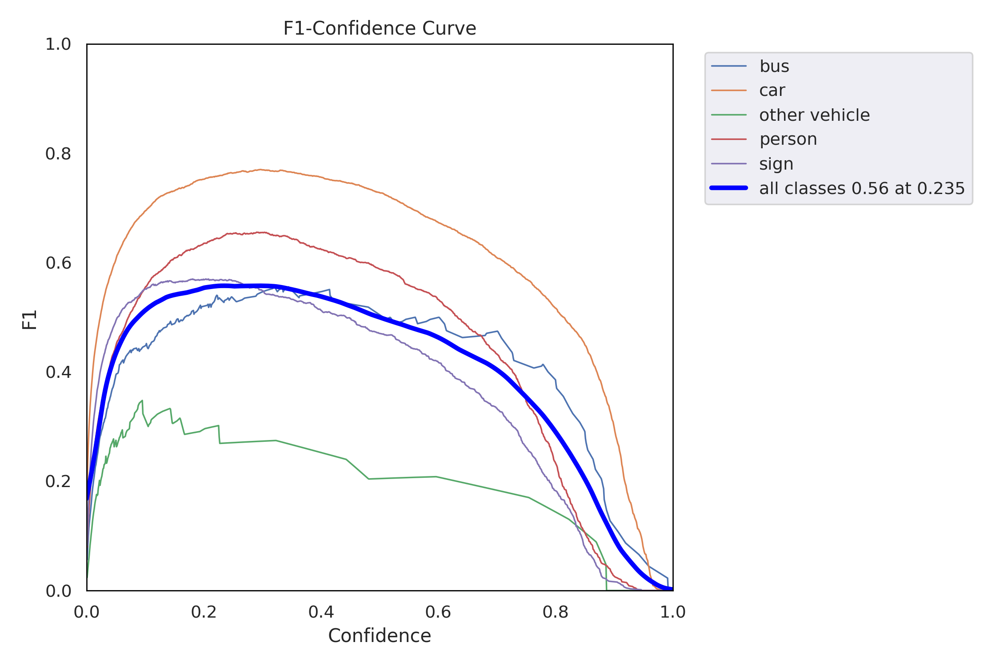

In [22]:
from IPython.display import Image
Image(filename=f"/content/yolov9/runs/val/exp5/F1_curve.png", width=600)

Precision-Recall Curve (the trade-off between precision and recall) - im więcej w prawym górnym rogu tym lepiej

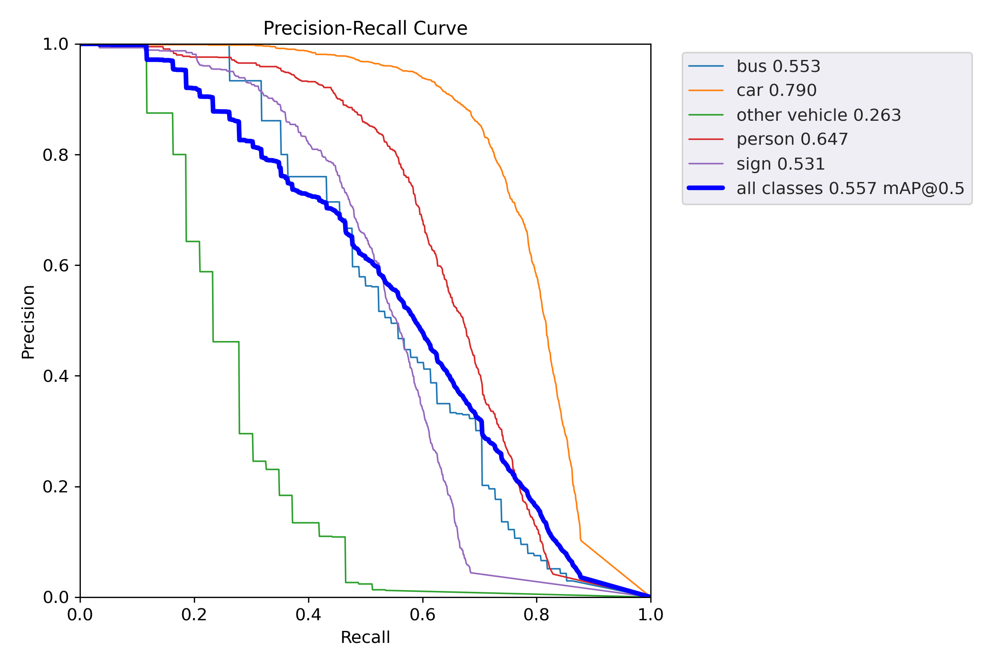

In [23]:
Image(filename=f"/content/yolov9/runs/val/exp5/PR_curve.png", width=600)

Precision-Confidence Curve (displays how precision changes with different confidence levels) - idealnie gdyby była wysoka precyzja dla wszystkich poziomów pewności

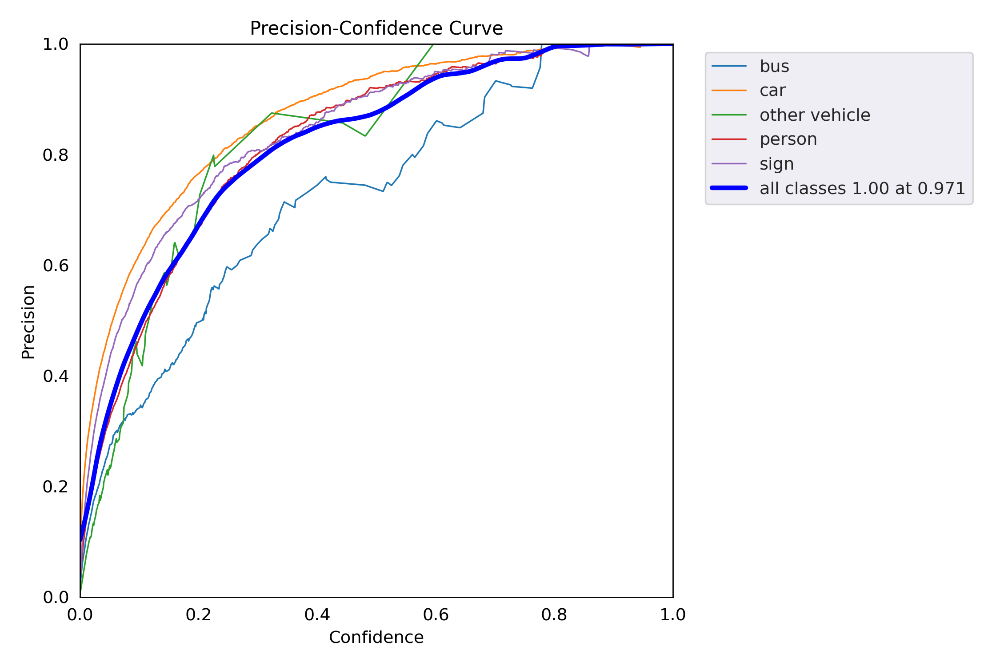

In [24]:
Image(filename=f"/content/yolov9/runs/val/exp5/P_curve.png", width=600)

Recall-Confidence Curve (shows the recall at various confidence thresholds) - oczekujemy wysokich poziomow dla wszystkich poziomów pewności

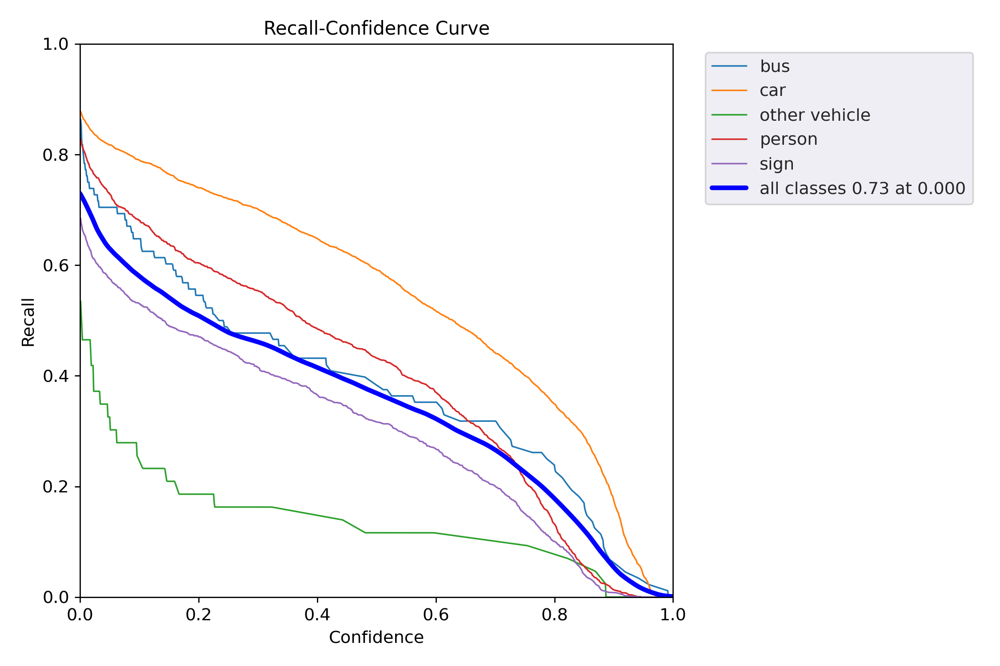

In [25]:
Image(filename=f"/content/yolov9/runs/val/exp5/R_curve.png", width=600)

Macierz błędów:


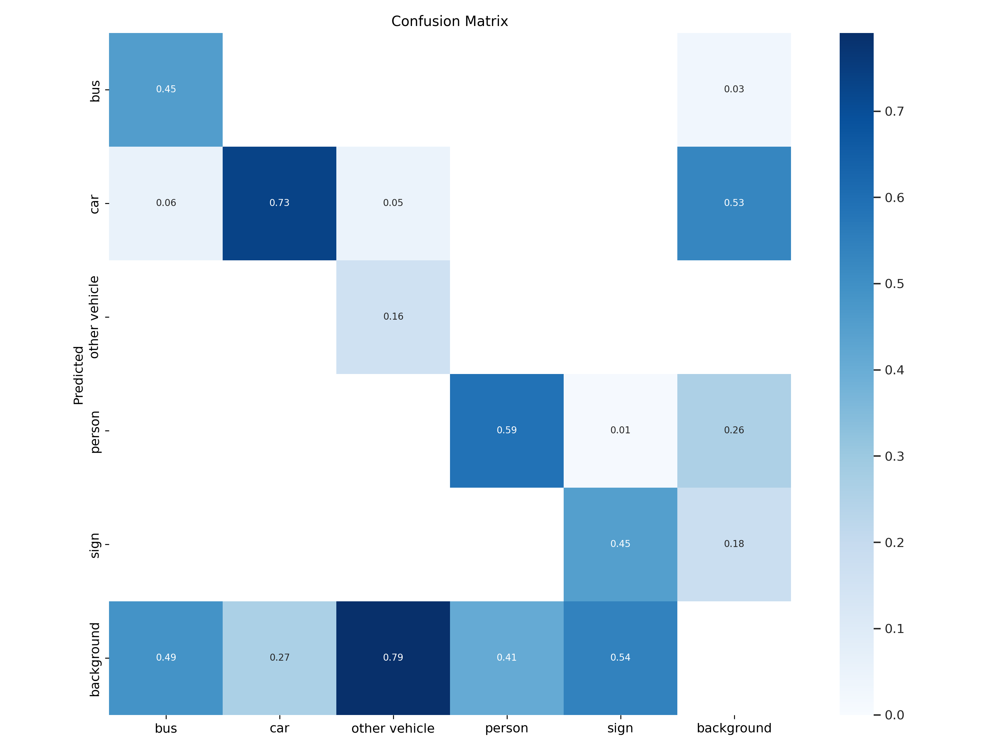

In [26]:
Image(filename=f"/content/yolov9/runs/val/exp5/confusion_matrix.png", width=1000)

#Przydatne narzędzia


###Usuwanie segmentation

In [ ]:
import json

# Otwieranie i ładowanie danych z pliku JSON
with open('/content/drive/MyDrive/ob_thermal_camera/data set/images_thermal_train/coco.json') as f:
    d = json.load(f)

# Modyfikowanie pola "segmentation" w każdej adnotacji
for ann in d["annotations"]:
    ann["segmentation"] = []

# Zapisywanie zmodyfikowanych danych do nowego pliku JSON z wcięciami
with open('/content/drive/MyDrive/ob_thermal_camera/data set/images_thermal_train/coco.json', 'w') as f:
    json.dump(d, f, indent=4)  # Ustawienie wcięć na 4 spacje

